Firstly, connect to the drive.

In [1]:
from google.colab import drive
drive.mount('/content/drive')
import sys
sys.path.insert(0,'/content/drive/My Drive')

Mounted at /content/drive


Next, load in some nice libraries.

In [14]:
#libraries
import plotly.graph_objects as go 
from plotly.subplots import make_subplots
from plotly.offline import iplot,init_notebook_mode
import torch #cpu only version
import torchvision
import torchvision.transforms as transforms
import numpy as np
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
import numpy as np
import torch
from copy import deepcopy
from torch.autograd.variable import Variable

Next, load in the MNIST data set.

In [15]:
BATCH_SIZE = 64
transform = transforms.Compose(
    [transforms.ToTensor(),transforms.Normalize((0.1307,), (0.3081, ))]) 
#load in full train set
trainsetfull = torchvision.datasets.MNIST(root='./data/mnist', train=True,
                                        download=True, transform=transform)
type(trainsetfull)
# data loader for final run 
trainfullloader = torch.utils.data.DataLoader(trainsetfull, batch_size=BATCH_SIZE,
                                          shuffle=True, num_workers=2)
#split the set 
trainset, valset = torch.utils.data.random_split(trainsetfull, [55000, 5000])
#load in test set
testset = torchvision.datasets.MNIST(root='./data/mnist', train=False, transform=transform,
                                       download=True)
len(testset)
# data loader for training
trainloader = torch.utils.data.DataLoader(trainset, batch_size=BATCH_SIZE,
                                          shuffle=True, num_workers=2)
# data loader for validation
valiloader = torch.utils.data.DataLoader(valset, batch_size=BATCH_SIZE,
                                          shuffle=True, num_workers=2)
# data loader for testing
testloader = torch.utils.data.DataLoader(testset, batch_size=BATCH_SIZE,
                                       shuffle=False, num_workers=2)

Next, set up GPU device.

In [16]:
if torch.cuda.is_available(): device = torch.device("cuda")
else: 
device = torch.device("cpu")
print(device)
import os
os.environ['CUDA_LAUNCH_BLOCKING'] = "1"

cpu


I tried the FID score with the Inception V3 model. But it just wouldn't work.


In [17]:
#https://www.kaggle.com/ibtesama/gan-in-pytorch-with-fid
import torchvision.models as models
class InceptionV3(nn.Module):
    """Pretrained InceptionV3 network returning feature maps"""

    # Index of default block of inception to return,
    # corresponds to output of final average pooling
    DEFAULT_BLOCK_INDEX = 3

    # Maps feature dimensionality to their output blocks indices
    BLOCK_INDEX_BY_DIM = {
        64: 0,   # First max pooling features
        192: 1,  # Second max pooling featurs
        768: 2,  # Pre-aux classifier features
        2048: 3  # Final average pooling features
    }

    def __init__(self,
                 output_blocks=[DEFAULT_BLOCK_INDEX],
                 resize_input=True,
                 normalize_input=True,
                 requires_grad=False):
        
        super(InceptionV3, self).__init__()

        self.resize_input = resize_input
        self.normalize_input = normalize_input
        self.output_blocks = sorted(output_blocks)
        self.last_needed_block = max(output_blocks)

        assert self.last_needed_block <= 3, \
            'Last possible output block index is 3'

        self.blocks = nn.ModuleList()

        
        inception = models.inception_v3(pretrained=True)

        # Block 0: input to maxpool1
        block0 = [
            inception.Conv2d_1a_3x3,
            inception.Conv2d_2a_3x3,
            inception.Conv2d_2b_3x3,
            nn.MaxPool2d(kernel_size=3, stride=2)
        ]
        self.blocks.append(nn.Sequential(*block0))

        # Block 1: maxpool1 to maxpool2
        if self.last_needed_block >= 1:
            block1 = [
                inception.Conv2d_3b_1x1,
                inception.Conv2d_4a_3x3,
                nn.MaxPool2d(kernel_size=3, stride=2)
            ]
            self.blocks.append(nn.Sequential(*block1))

        # Block 2: maxpool2 to aux classifier
        if self.last_needed_block >= 2:
            block2 = [
                inception.Mixed_5b,
                inception.Mixed_5c,
                inception.Mixed_5d,
                inception.Mixed_6a,
                inception.Mixed_6b,
                inception.Mixed_6c,
                inception.Mixed_6d,
                inception.Mixed_6e,
            ]
            self.blocks.append(nn.Sequential(*block2))

        # Block 3: aux classifier to final avgpool
        if self.last_needed_block >= 3:
            block3 = [
                inception.Mixed_7a,
                inception.Mixed_7b,
                inception.Mixed_7c,
                nn.AdaptiveAvgPool2d(output_size=(1, 1))
            ]
            self.blocks.append(nn.Sequential(*block3))

        for param in self.parameters():
            param.requires_grad = requires_grad

    def forward(self, inp):
        """Get Inception feature maps
        Parameters
        ----------
        inp : torch.autograd.Variable
            Input tensor of shape Bx3xHxW. Values are expected to be in
            range (0, 1)
        Returns
        -------
        List of torch.autograd.Variable, corresponding to the selected output
        block, sorted ascending by index
        """
        outp = []
        x = inp

        if self.resize_input:
            x = F.interpolate(x,
                              size=(299, 299),
                              mode='bilinear',
                              align_corners=False)

        if self.normalize_input:
            x = 2 * x - 1  # Scale from range (0, 1) to range (-1, 1)

        for idx, block in enumerate(self.blocks):
            x = block(x)
            if idx in self.output_blocks:
                outp.append(x)

            if idx == self.last_needed_block:
                break

        return outp
    
block_idx = InceptionV3.BLOCK_INDEX_BY_DIM[2048]
model = InceptionV3([block_idx])
model=model.cuda()

In [18]:
def calculate_activation_statistics(images,model,batch_size=BATCH_SIZE, dims=2048,
                    cuda=False):
    model.eval()
    act=np.empty((len(images), dims))
    
    if cuda:
        batch=images.to('cuda')
    else:
        batch=images.to('cuda')

    pred = model(batch)[0]
    pred = pred.to('cpu')
    batch = batch.to('cpu')
        # If model output is not scalar, apply global spatial average pooling.
        # This happens if you choose a dimensionality not equal 2048.
    if pred.size(2) != 1 or pred.size(3) != 1:
        pred = adaptive_avg_pool2d(pred, output_size=(1, 1))

    act= pred.cpu().data.numpy().reshape(pred.size(0), -1)
    
    mu = np.mean(act, axis=0)
    sigma = np.cov(act, rowvar=False)
    return mu, sigma

def calculate_frechet_distance(mu1, sigma1, mu2, sigma2, eps=1e-6):
    """Numpy implementation of the Frechet Distance.
    The Frechet distance between two multivariate Gaussians X_1 ~ N(mu_1, C_1)
    and X_2 ~ N(mu_2, C_2) is
            d^2 = ||mu_1 - mu_2||^2 + Tr(C_1 + C_2 - 2*sqrt(C_1*C_2)).
    """
    from scipy import linalg
    mu1 = np.atleast_1d(mu1)
    mu2 = np.atleast_1d(mu2)

    sigma1 = np.atleast_2d(sigma1)
    sigma2 = np.atleast_2d(sigma2)

    assert mu1.shape == mu2.shape, \
        'Training and test mean vectors have different lengths'
    assert sigma1.shape == sigma2.shape, \
        'Training and test covariances have different dimensions'

    diff = mu1 - mu2

    
    covmean, _ = linalg.sqrtm(sigma1.dot(sigma2), disp=False)
    if not np.isfinite(covmean).all():
        msg = ('fid calculation produces singular product; '
               'adding %s to diagonal of cov estimates') % eps
        print(msg)
        offset = np.eye(sigma1.shape[0]) * eps
        covmean = linalg.sqrtm((sigma1 + offset).dot(sigma2 + offset))

    
    if np.iscomplexobj(covmean):
        if not np.allclose(np.diagonal(covmean).imag, 0, atol=1e-3):
            m = np.max(np.abs(covmean.imag))
            raise ValueError('Imaginary component {}'.format(m))
        covmean = covmean.real

    tr_covmean = np.trace(covmean)

    return (diff.dot(diff) + np.trace(sigma1) +
            np.trace(sigma2) - 2 * tr_covmean)
    
def calculate_fretchet(images_real,images_fake,model):
     mu_1,std_1=calculate_activation_statistics(images_real,model,cuda=False)
     mu_2,std_2=calculate_activation_statistics(images_fake,model,cuda=False)
    
     """get fretched distance"""
     fid_value = calculate_frechet_distance(mu_1, std_1, mu_2, std_2)
     return fid_value

Next, the VAE and GAN classes are implemented, from the lecture slides. To start with the GAN.


In [19]:
M = 28*28
D = 16
loss = nn.BCELoss()


class Discriminator(nn.Module):
  """
  https://medium.com/ai-society/gans-from-scratch-1-a-deep-introduction-with-code-in-pytorch-and-tensorflow-cb03cdcdba0f
  Discriminator class.
  """
  def __init__(self, M):
    super(Discriminator,self).__init__()
    self.M = M

    self.dis1 = nn.Linear(in_features= self.M, out_features=300)
    self.dis2 = nn.Linear(in_features=300, out_features=1)

  def forward(self, x):
    x = self.dis1(x).to(device)
    x = F.relu(x)
    x = self.dis2(x)
    x = torch.sigmoid(x)
    return x

  def gen_loss(self, d_gen): return torch.sum(-1*torch.log(1. - d_gen))

discriminator = Discriminator(M=M)
d_optimizer = optim.Adam(discriminator.parameters(), lr=0.0002)

class Generator(nn.Module):
  """
  https://medium.com/ai-society/gans-from-scratch-1-a-deep-introduction-with-code-in-pytorch-and-tensorflow-cb03cdcdba0f
  Discriminator class.
  """
  def __init__(self, M, D ):
    super(Generator,self).__init__()
    self.M = M
    self.D = D

    self.gen1 = nn.Linear(in_features= self.D, out_features=300)
    self.gen2 = nn.Linear(in_features=300, out_features= self.M)

  def forward(self, N):
    z = torch.randn(size=(N, self.D)).to(device)
    x_gen = self.gen1(z)
    x_gen = nn.functional.relu(x_gen,inplace=False)
    x_gen = self.gen2(x_gen)
    return x_gen

  def generate_sample(self, z):
    x_gen = self.gen1(z)
    x_gen = nn.functional.relu(x_gen,inplace=False)
    x_gen = self.gen2(x_gen)
    return x_gen

  def dis_loss(self, d_real, d_gen):  return torch.sum(-(torch.log(d_real) + torch.log(1. - d_gen)))


generator = Generator(M=M, D=D)
g_optimizer = optim.Adam(generator.parameters(), lr=0.0002)

def train_dis(optimizer, x_real):
  x_real = x_real.view(x_real.size(0), -1).to(device)
  optimizer.zero_grad()

  #real error
  d_real = discriminator(x_real.to(device))
  d_loss = loss(d_real.to(device), Variable(torch.ones(x_real.size(0), 1)).to(device))
  d_loss.backward()

  #fake error
  d_fake = discriminator(generator(x_real.size(0)).to(device))
  d_loss_fake = loss(d_fake, Variable(torch.zeros(x_real.size(0), 1)).to(device))
  d_loss_fake.backward()

  #total_error = d_loss + d_loss_fake
  optimizer.step()

  return d_loss.to('cpu'), d_loss_fake.to('cpu'), d_real.to('cpu'), d_fake.to('cpu')

def train_gen(optimizer, x_real):
  optimizer.zero_grad()

  d_fake =  discriminator(generator(x_real.size(0)).to(device))
  d_loss_fake = loss(d_fake,Variable(torch.ones(x_real.size(0), 1)).to(device))
  d_loss_fake.backward()

  optimizer.step()
  return d_fake.to('cpu')

def train_GAN(gen_mod, dis_mod, trainloader, d_optimizer, g_optimizer, epochs = 51):
  d_loss_fake_errors, d_loss_real_errors, gen_errors = [], [], []

  for epoch in range(0, epochs):
    print("Epoch: {}".format(epoch))
    for i, data in enumerate(trainloader):
      x_real = data[0].to(device)
      x_real =  x_real.view(x_real.size(0), -1).to(device)

      # discriminator
      d_loss, d_loss_fake, d_real, d_fake = train_dis(d_optimizer, x_real)

      # generator
      gen_error =  train_gen(g_optimizer,x_real)

      d_loss_fake_errors.append(d_loss_fake)
      d_loss_real_errors.append(d_loss)
      gen_errors.append(gen_error)

 

      if (epoch%10 == 0) and (i == len(trainloader)-1):
        num_rows = 8
        printed = generator(8).view(8, 1, 28, 28)
        torchvision.utils.save_image(printed.cpu(), f"/content/drive/My Drive/graphs/output_GAN_{epoch}.png", nrow=num_rows)
  
  return gen_mod, dis_mod, d_loss_fake_errors, d_loss_real_errors, gen_errors

generator.to(device)
discriminator.to(device)

gen_mod_trained, dis_mod_trained, d_fake_loss, d_real_loss, gen_loss = train_GAN(generator, discriminator, trainloader, d_optimizer, g_optimizer)



Epoch: 0
Epoch: 1
Epoch: 2
Epoch: 3
Epoch: 4
Epoch: 5
Epoch: 6
Epoch: 7
Epoch: 8
Epoch: 9
Epoch: 10
Epoch: 11
Epoch: 12
Epoch: 13
Epoch: 14
Epoch: 15
Epoch: 16
Epoch: 17
Epoch: 18
Epoch: 19
Epoch: 20
Epoch: 21
Epoch: 22
Epoch: 23
Epoch: 24
Epoch: 25
Epoch: 26
Epoch: 27
Epoch: 28
Epoch: 29
Epoch: 30
Epoch: 31
Epoch: 32
Epoch: 33
Epoch: 34
Epoch: 35
Epoch: 36
Epoch: 37
Epoch: 38
Epoch: 39
Epoch: 40
Epoch: 41
Epoch: 42
Epoch: 43
Epoch: 44
Epoch: 45
Epoch: 46
Epoch: 47
Epoch: 48
Epoch: 49
Epoch: 50


Trying the FID....

In [ ]:
# def FID(model, testdataloader):
#       #FID
#     fids = []
#     for i, data in enumerate(testdataloader):
#       #print(data)
#       x_real = data[0].to(device)
#       x_real =  x_real.view(x_real.size(0), -1)

#       x_fake = generator(x_real.size(0)).to(device)
#       x_fake = x_fake.view((64,1,28,28))
#       zeros = torch.zeros((64,3,28,28)).to(device)
#       x_fake = x_fake + zeros
#       x_real =  data[0] + zeros
#       print(x_fake.size())
#       fretchet_dist=calculate_fretchet(x_real,x_fake,model) 
#       print(fretchet_dist)
#       fids.append(fretchet_dist)
#     return fids.to('cpu')

# fids_GAN =  FID(model=model,testdataloader= testloader)

torch.Size([64, 3, 28, 28])
245.60067655845813
torch.Size([64, 3, 28, 28])


KeyboardInterrupt: ignored

Now, the VAE is trained on the MNIST data.

In [20]:
class VAE(nn.Module):
  """
  This VEA class is from the slides.
  The encoding and decoding layers are linear layers.
  https://debuggercafe.com/getting-started-with-variational-autoencoder-using-pytorch/
  """
  def __init__(self, D, M):
    super(VAE, self).__init__()
    self.D = D
    self.M = M
    
    #encoding layers
    self.enc1 = nn.Linear(in_features=self.D, out_features=300)
    self.enc2 = nn.Linear(in_features=300, out_features=self.M*2)

    #decoding layers
    self.dec1 = nn.Linear(in_features=self.M, out_features=300)
    self.dec2 = nn.Linear(in_features=300, out_features=self.D)

  def reparameterize(self, mu, log_std):
    std = torch.exp(log_std)
    eps = torch.randn_like(std)
    z = mu + (eps * std)
    return z

  def forward(self, x):
    # encoder
    x = self.enc1(x)
    x = nn.functional.relu(x)
    x = self.enc2(x).view(-1, 2, self.M)

    # get mean and log-std
    mu = x[:, 0, :]
    log_std = x[:, 1, :]

    # reparameterization
    z = self.reparameterize(mu, log_std)

    # decoder
    x_hat = nn.functional.relu(self.dec1(z))
    x_hat = torch.sigmoid(self.dec2(x_hat))
    return x_hat, mu, z, log_std

  def generate(self, z):
    x_hat = nn.functional.relu(self.dec1(z))
    x_hat = torch.sigmoid(self.dec2(x_hat))
    return x_hat

  def elbo(self, x, x_hat, z, mu, log_std):
    #https://discuss.pytorch.org/t/multivariate-gaussian-variational-autoencoder-the-decoder-part/58235/3
    #reconstruction error
    # RE = nn.BCELoss()
    RE = F.binary_cross_entropy(x_hat, x)
    # RE= RE(x_hat, x)
    #print(RE)
    #KL term https://chrisorm.github.io/VAE-pyt.html
    KL = -0.5 * torch.sum(1 + log_std - mu.pow(2) - log_std.exp())
    KL /= (784 * x_hat.size(0))

    return RE + KL

In [21]:
def fit(model, dataloader, optimizer):
    model.train()
    running_loss = 0.0

    for i, data in enumerate(dataloader):

        data = data[0].to(device)
        data = data.view(data.size(0),-1)

        optimizer.zero_grad()
        data_hat, mu,z, log_std = model(data)
        loss = model.elbo(x = data, x_hat = data_hat,z=z, mu = mu, log_std = log_std)
        running_loss += loss.item()
        loss.backward()
        optimizer.step()

    train_loss = running_loss/len(dataloader.dataset)
    return train_loss

    #from google.colab import files
def validate(model, valdataloader, epoch):
    model.eval()
    running_loss = 0.0
    with torch.no_grad():
        for i, data in enumerate(valdataloader):
            #data, _ = data
            data = data[0].to(device)
            data = data.view(data.size(0),-1)
            data_hat, mu, z, log_std = model(data)
            loss = model.elbo(data, data_hat,z, mu, log_std)
            running_loss += loss.item()

            if (epoch%10 == 0) and (i == len(valiloader)-1):
                # save the last 8 samples input and output of every 10th epoch
                num_rows = 8
                both = torch.cat((data.view(len(data), 1, 28, 28)[:8], 
                                  data_hat.view(len(data), 1, 28, 28)[:8]))
                torchvision.utils.save_image(both.cpu(), f"/content/drive/My Drive/graphs/output{epoch}.png", nrow=num_rows)
    
    #val_loss = running_loss/len(valiloader.dataset)
    return running_loss/len(valiloader.dataset)

def train(model, trainloader, valiloader, optimizer, epochs):
  train_loss, val_loss = [], []

  for epoch in range(epochs):
      print(f"Epoch {epoch+1} of {epochs}")
      train_epoch_loss = fit(model, trainloader, optimizer)
      val_epoch_loss = validate(model, valiloader, epoch)
      train_loss.append(train_epoch_loss)
      val_loss.append(val_epoch_loss)
      print(f"Train Loss: {train_epoch_loss:.4f}")
      print(f"Val Loss: {val_epoch_loss:.4f}")

  return model, train_loss, val_loss

In [22]:
net = VAE(D = 28*28*1, M = 16)
net.to(device)
optimizer = optim.Adam(net.parameters(), lr = 0.005)
net, train_loss, val_loss= train(net, trainloader, valiloader, optimizer, 50 )

Epoch 1 of 50
Train Loss: -0.5743
Val Loss: -0.6644
Epoch 2 of 50
Train Loss: -0.6818
Val Loss: -0.6942
Epoch 3 of 50
Train Loss: -0.7002
Val Loss: -0.7120
Epoch 4 of 50
Train Loss: -0.7077
Val Loss: -0.7154
Epoch 5 of 50
Train Loss: -0.7107
Val Loss: -0.7176
Epoch 6 of 50
Train Loss: -0.7114
Val Loss: -0.7093
Epoch 7 of 50
Train Loss: -0.7097
Val Loss: -0.7094
Epoch 8 of 50
Train Loss: -0.7080
Val Loss: -0.7088
Epoch 9 of 50
Train Loss: -0.7060
Val Loss: -0.7068
Epoch 10 of 50
Train Loss: -0.7024
Val Loss: -0.7009
Epoch 11 of 50
Train Loss: -0.7011
Val Loss: -0.7011
Epoch 12 of 50
Train Loss: -0.7029
Val Loss: -0.7047
Epoch 13 of 50
Train Loss: -0.7011
Val Loss: -0.7061
Epoch 14 of 50
Train Loss: -0.6994
Val Loss: -0.7005
Epoch 15 of 50
Train Loss: -0.7013
Val Loss: -0.7255
Epoch 16 of 50
Train Loss: -0.7147
Val Loss: -0.7092
Epoch 17 of 50
Train Loss: -0.7139
Val Loss: -0.7120
Epoch 18 of 50
Train Loss: -0.7131
Val Loss: -0.7156
Epoch 19 of 50
Train Loss: -0.7148
Val Loss: -0.7176
Ep

In [ ]:
import matplotlib
matplotlib.use('Agg')
import matplotlib.pyplot as plt
import numpy as np
from sklearn.manifold import TSNE
fig2 = plt.figure()

def plot_tsne(z_loc, classes, name):
    #https://github.com/pyro-ppl/pyro/blob/dev/examples/vae/vae.py
    model_tsne = TSNE(n_components=2, random_state=0)
    z_states = z_loc.detach().cpu().numpy()
    z_embed = model_tsne.fit_transform(z_states)
    classes = classes.detach().cpu().numpy()
    print(classes)
    colors = ['red', 'blue', 'black', 'green' , 'orange', 'yellow', 'brown', 'purple', 'gray', 'lightblue']
    for ic in range(10):
        ind_vec = np.zeros_like(classes)
        #ind_vec[:, ic] = 1
        ind_class = classes[:] == ic
        #color = plt.cm.Set1(ic)
        plt.scatter(z_embed[ind_class, 0], z_embed[ind_class, 1], s=10, color=colors[ic])
        plt.title("Latent Variable T-SNE per Class for the MNIST test dataset")

def sne(vae: VAE, test_loader):
  data = test_loader.dataset.test_data.float().view(len(test_loader.dataset),-1)
  labels = test_loader.dataset.test_labels
  _, z_loc, _, z_scale = vae.forward(data)
  plot_tsne(z_loc, labels, "YEET")




In [ ]:
sne(net, testloader)

/usr/local/lib/python3.6/dist-packages/torchvision/datasets/mnist.py:63: UserWarning:

test_data has been renamed data

/usr/local/lib/python3.6/dist-packages/torchvision/datasets/mnist.py:53: UserWarning:

test_labels has been renamed targets



[7 2 1 ... 4 5 6]


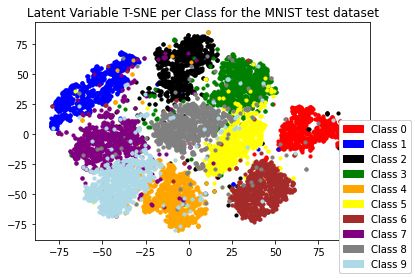

In [ ]:

fig2

In [ ]:
import matplotlib.patches as m
colors = ['red', 'blue', 'black', 'green' , 'orange', 'yellow', 'brown', 'purple', 'gray', 'lightblue']
legend = [
          m.Patch(color = colors[0], label = "Class 0"),
          m.Patch(color = colors[1], label = "Class 1"),
          m.Patch(color = colors[2], label = "Class 2"),
          m.Patch(color = colors[3], label = "Class 3"),
          m.Patch(color = colors[4], label = "Class 4"),
          m.Patch(color = colors[5], label = "Class 5"),
          m.Patch(color = colors[6], label = "Class 6"),
          m.Patch(color = colors[7], label = "Class 7"),
          m.Patch(color = colors[8], label = "Class 8"),
          m.Patch(color = colors[9], label = "Class 9"),
          
]
fig2.legend(handles = legend, loc = 'lower right')
#ax.get_legend().remove()

NameError: ignored

The interpolation and generating images.

In [64]:
def interpolation():
  z1 = torch.randn(size=(1, 16)).to(device)
  z2 = torch.randn(size=(1, 16)).to(device)

  diff =  (z1 - z2)/11
  for i in range(0,13):
    #VAE part
    out_vae = net.generate(z1*2.5+2.5 + i*diff)

    #GAN part
    out_gan = generator.generate_sample(z1 + i*diff)

        # save the last 8 samples input and output of every 10th epoch
    num_rows = 1
    both = torch.cat((out_vae.view(1, 1, 28, 28), 
                      out_gan.view(1, 1, 28, 28)))
    torchvision.utils.save_image(both.cpu(), f"/content/drive/My Drive/graphs/interpolate{i}.png", nrow=num_rows)


interpolation()

In [33]:
# from stack overflow but could not find the link anymore, makes sure plotly figures are displayed
import plotly
plotly.offline.init_notebook_mode(connected=False)
def configure_plotly_browser_state():
  import IPython
  display(IPython.core.display.HTML('''
        <script src="/static/components/requirejs/require.js"></script>
        <script>
          requirejs.config({
            paths: {
              base: '/static/base',
              plotly: 'https://cdn.plot.ly/plotly-latest.min.js?noext',
            },
          });
        </script>
        '''))
  

Loss curve GAN.

In [45]:
configure_plotly_browser_state()
fig6 = go.Figure()
fig6.add_trace(go.Scatter(x = list(np.arange(0, len(d_fake_loss))) ,
                         y = [item.detach().numpy().item(0)  for item in d_fake_loss],
                         name = "Discriminator fake loss",
                        connectgaps = True, 
                        line_color = 'blue'))
print("OK")
fig6.add_trace(go.Scatter(x = list(np.arange(0, len(d_real_loss))) ,
                         y = [item.detach().numpy().item(0)  for item in d_real_loss],
                         name = "Discriminator real loss",
                        connectgaps = True, 
                        line_color = 'red'))
print("OK")
fig6.add_trace(go.Scatter(x = list(np.arange(0, len(gen_loss))) ,
                         y = [item.detach().numpy().item(0) for item in gen_loss],
                         name = "Generator loss",
                        connectgaps = True,
                        line_color = 'gray'))
print("OK")
fig6.update_xaxes(title_text = "Batch/step", range = [0,1000] )
fig6.update_yaxes(title_text = "Loss")

fig6.update_xaxes(nticks = 6)
fig6.update_layout(
    title = "The Generator and Discriminator loss during training on the MNIST data",
    title_x=0.5,
    height=450, width=800,
    font=dict(
        family="Courier New, monospace",
        size=12,
        color="black"
    ),
    legend=dict(
    orientation="h",
    yanchor="bottom",
    y=-0.45,
    xanchor="center",
    x=0.5
)
)
fig6.show()

OK
OK
OK


Loss curve VAE.

In [51]:
configure_plotly_browser_state()
fig7 = go.Figure()
fig7.add_trace(go.Scatter(x = list(np.arange(0, len(train_loss))) ,
                         y = [item for item in train_loss],
                         name = "Train loss",
                        connectgaps = True, 
                        line_color = 'blue'))

fig7.add_trace(go.Scatter(x = list(np.arange(0, len(val_loss))) ,
                         y = [item for item in val_loss],
                         name = "Validation loss",
                        connectgaps = True, 
                        line_color = 'red'))

fig7.update_xaxes(title_text = "Epoch", range = [0,50] )
fig7.update_yaxes(title_text = "Loss")

fig7.update_xaxes(nticks = 6)
fig7.update_layout(
    title = "The training and validation loss on the MNIST data",
    title_x=0.5,
    height=450, width=800,
    font=dict(
        family="Courier New, monospace",
        size=12,
        color="black"
    ),
    legend=dict(
    orientation="h",
    yanchor="bottom",
    y=-0.45,
    xanchor="center",
    x=0.5
)
)
fig7.show()